<a href="https://colab.research.google.com/github/FaresIbrahim32/Dog-breed-vision-model/blob/main/dog_breed_vision.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

In [2]:
import datetime
import os

#  End-to-End MultiClass Dog Breed Classification

This notebook builds a deep classification model for dog breeds using TensorFlow and TensorFlow Hub

## 1. Problem

Identifying the breed of a dog given an image of a dog

##2. Data

Dog breed identification dataset from kaggle https://www.kaggle.com/competitions/dog-breed-identification

## 3. Evaluation

The evaluation is a file with prediction probabilities for each dog breed of each test image . The one metric to use is Multi Class Log Loss

## 4. Features

We're dealing with images (unstrucutred data) of 120 different dog breeds ( 120 different classes) . We will use deep learning / transfer learning hopefully . The dataset itself is 10k+ images for the training set and 10k+ images for the test

# Get our workspace ready

In [3]:
import tensorflow as tf
import tensorflow_hub as hub
print("TF version:", tf.__version__)
print("Hub version:", hub.__version__)

TF version: 2.15.1
Hub version: 0.16.1


In [4]:
print("GPU", "available" if tf.config.list_physical_devices("GPU") else "not available")

GPU not available


## Getting our data ready (turning into tensors)
with all machine learning models, our data has to be in a numerical format. So that's what we do first -> turn our images into tensors (numerical representations)

checking our labels first

In [5]:
labels = pd.read_csv("/content/drive/MyDrive/dog-breed-identification/labels.csv")
labels.head()

,id,breed
0,000bec180eb18c7604dcecc8fe0dba07,boston_bull
1,001513dfcb2ffafc82cccf4d8bbaba97,dingo
2,001cdf01b096e06d78e9e5112d419397,pekinese
3,00214f311d5d2247d5dfe4fe24b2303d,bluetick
4,0021f9ceb3235effd7fcde7f7538ed62,golden_retriever


In [6]:
len(labels)

10222

<Axes: xlabel='breed'>

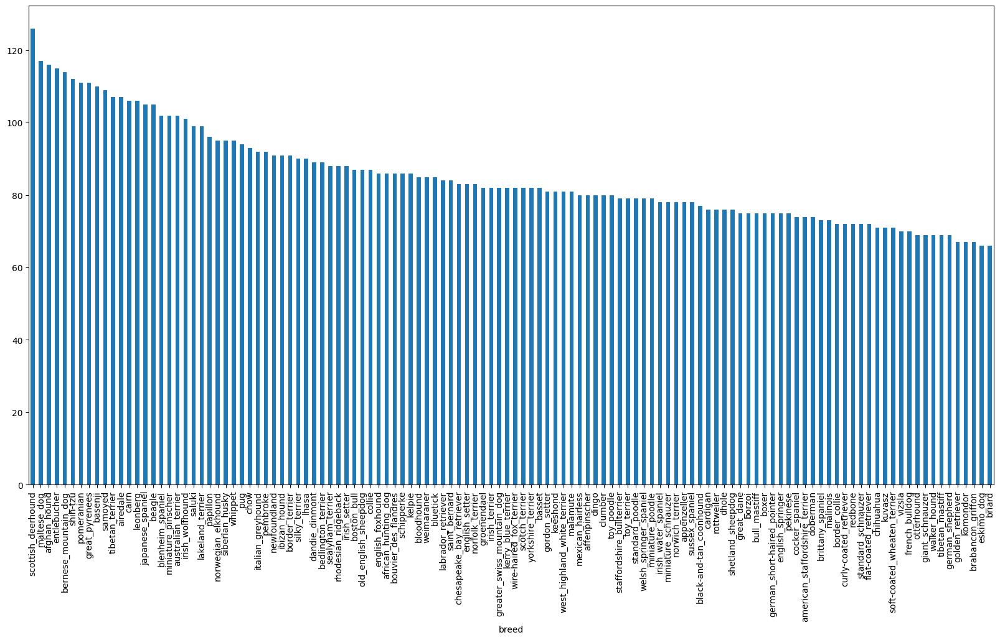

In [7]:
labels["breed"].value_counts().plot.bar(figsize=(20,10))

In [8]:
len(labels["breed"].unique())

120

In [9]:
labels.describe()

,id,breed
count,10222,10222
unique,10222,120
top,fff43b07992508bc822f33d8ffd902ae,scottish_deerhound
freq,1,126


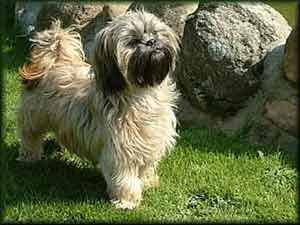

In [10]:
from IPython.display import Image, display
Image('/content/drive/MyDrive/dog-breed-identification/test/001a5f3114548acdefa3d4da05474c2e.jpg')

## Getting images and their labels
a list of all image filenames paths

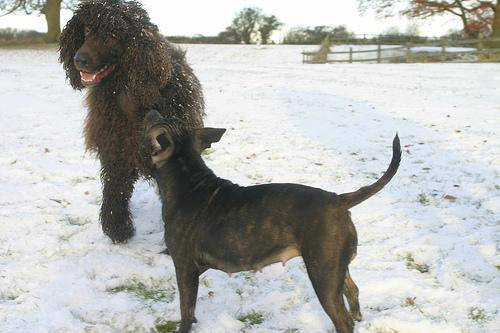

In [11]:
roots = '/content/drive/MyDrive/dog-breed-identification/train/'

lst = []

for i in labels.id:
  image_path = roots + i +'.jpg'
  lst.append(image_path)

Image(lst[27])

In [12]:
import os

if len(os.listdir(roots)) == len(lst):
  print("OKAY")

OKAY


In [13]:
labels_np = labels['breed']
labels_arr = np.array(labels_np)
print(labels_arr)

['boston_bull' 'dingo' 'pekinese' ... 'airedale' 'miniature_pinscher'
 'chesapeake_bay_retriever']


In [14]:
labels_arr

array(['boston_bull', 'dingo', 'pekinese', ..., 'airedale',
       'miniature_pinscher', 'chesapeake_bay_retriever'], dtype=object)

In [15]:
if len(labels_arr) == len(lst):
  print("OKAY")

OKAY


In [16]:
un = np.unique(labels_arr)
print(un)

['affenpinscher' 'afghan_hound' 'african_hunting_dog' 'airedale'
 'american_staffordshire_terrier' 'appenzeller' 'australian_terrier'
 'basenji' 'basset' 'beagle' 'bedlington_terrier' 'bernese_mountain_dog'
 'black-and-tan_coonhound' 'blenheim_spaniel' 'bloodhound' 'bluetick'
 'border_collie' 'border_terrier' 'borzoi' 'boston_bull'
 'bouvier_des_flandres' 'boxer' 'brabancon_griffon' 'briard'
 'brittany_spaniel' 'bull_mastiff' 'cairn' 'cardigan'
 'chesapeake_bay_retriever' 'chihuahua' 'chow' 'clumber' 'cocker_spaniel'
 'collie' 'curly-coated_retriever' 'dandie_dinmont' 'dhole' 'dingo'
 'doberman' 'english_foxhound' 'english_setter' 'english_springer'
 'entlebucher' 'eskimo_dog' 'flat-coated_retriever' 'french_bulldog'
 'german_shepherd' 'german_short-haired_pointer' 'giant_schnauzer'
 'golden_retriever' 'gordon_setter' 'great_dane' 'great_pyrenees'
 'greater_swiss_mountain_dog' 'groenendael' 'ibizan_hound' 'irish_setter'
 'irish_terrier' 'irish_water_spaniel' 'irish_wolfhound'
 'italian

In [17]:
boolean_labels = [label == un for label in labels_arr ]
boolean_labels

[array([False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False,  True, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False]),
 array([False, False, False, False, False, Fal

In [18]:
len(boolean_labels)

10222

## Creating our own validation set
 Kaggle dataset doesn't provide a validation dataset so we make our own

In [19]:
x = lst
y = boolean_labels


In [20]:
# set number of images to use for expirmenting
NUM_IMAGES = 1000 #@param {type:"slider",min:1000,max:10000}

In [21]:
# split our data into train and validation of total size NUM_IMAGES
from sklearn.model_selection import train_test_split
x_train,x_val,y_train,y_val = train_test_split(x[:NUM_IMAGES],y[:NUM_IMAGES],test_size=0.2,random_state=42)

len(x_train),len(x_val),len(y_train),len(y_val)

(800, 200, 800, 200)

In [22]:
x_train[:5],y_train[:5]

(['/content/drive/MyDrive/dog-breed-identification/train/00bee065dcec471f26394855c5c2f3de.jpg',
  '/content/drive/MyDrive/dog-breed-identification/train/0d2f9e12a2611d911d91a339074c8154.jpg',
  '/content/drive/MyDrive/dog-breed-identification/train/1108e48ce3e2d7d7fb527ae6e40ab486.jpg',
  '/content/drive/MyDrive/dog-breed-identification/train/0dc3196b4213a2733d7f4bdcd41699d3.jpg',
  '/content/drive/MyDrive/dog-breed-identification/train/146fbfac6b5b1f0de83a5d0c1b473377.jpg'],
 [array([False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False,  True,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False,

# Preprocessing images

In [23]:
# Convert an image to a Numpy array for demo
from matplotlib.pyplot import imread
image= imread(lst[42])
image.shape

(257, 350, 3)

In [24]:
tf.constant(image)

<tf.Tensor: shape=(257, 350, 3), dtype=uint8, numpy=
array([[[ 89, 137,  89],
        [ 76, 124,  76],
        [ 63, 111,  61],
        ...,
        [ 77, 133,  86],
        [ 76, 134,  86],
        [ 76, 134,  86]],

       [[ 72, 119,  75],
        [ 67, 114,  68],
        [ 63, 110,  64],
        ...,
        [ 75, 131,  84],
        [ 74, 132,  84],
        [ 74, 132,  84]],

       [[ 56, 104,  66],
        [ 58, 106,  68],
        [ 64, 112,  74],
        ...,
        [ 71, 127,  82],
        [ 73, 129,  84],
        [ 74, 130,  85]],

       ...,

       [[  2,  11,  10],
        [  5,  14,  11],
        [  8,  14,  14],
        ...,
        [120, 113,  67],
        [126, 118,  71],
        [122, 114,  67]],

       [[  0,   3,   7],
        [  2,   7,  10],
        [  3,   9,   7],
        ...,
        [105,  98,  54],
        [112, 104,  58],
        [111, 103,  57]],

       [[ 16,  18,  30],
        [ 16,  19,  24],
        [ 15,  20,  14],
        ...,
        [101,  92,  5

In [25]:
IMG_SIZE = 224

#Create a function for preprocessing images
def process_image(filepath):
  image = tf.io.read_file(filepath)
  image = tf.io.decode_jpeg(image,channels=3)
  image = tf.image.convert_image_dtype(image,tf.float32)
  image = tf.image.resize(image,size=[IMG_SIZE,IMG_SIZE])
  return image

## Turning our data into batches

If we have a dataset of 20,000 images , then our GPU wont be able to process all of them at once

It needs to divide them into batches . 32 batch size is the standard and depending on how training goes , we adjust that batch size

In order to use our TensorFlow effectively , we need our data in the form of Tensor tuples that are like this : (image,label) . We would pass 32 out of these tuples at a time and the model will figure out patterns in the image that would lead to its label


In [26]:
# Create a simple function that would return a tuple of tensors (image,label)
def get_image_label(filepath,label):
  image = process_image(filepath)
  return image,label

## After that step,make a function to turn all of our data x & y into batches


In [27]:
# Define batch size = 32
BATCH_SIZE=32

#Create a function to turn data into batches
def create_data_batches(x,y,batch_size=BATCH_SIZE,valid_data=False,test_data=False):

  if test_data:
    print("Creating test data batches...")
    data = tf.data.Dataset.from_tensor_slices((tf.constant(x)))
    data_batch = data.map(process_image).batch(BATCH_SIZE)
    return data_batch
  elif valid_data:
    print("Creating validation data batches...")
    data = tf.data.Dataset.from_tensor_slices((tf.constant(x),tf.constant(y)))
    data_batch = data.map(get_image_label).batch(BATCH_SIZE)
    return data_batch
  else:
    print("Creating training data batches..")
    data = tf.data.Dataset.from_tensor_slices((tf.constant(x),tf.constant(y)))
    data = data.shuffle(buffer_size=len(x))
    data = data.map(get_image_label)
    data_batch = data.batch(BATCH_SIZE)
    return data_batch




In [28]:
# Create training and validation data batches
train_data = create_data_batches(x_train,y_train)
val_data = create_data_batches(x_val,y_val,valid_data=True)

Creating training data batches..
Creating validation data batches...


In [29]:
train_data.element_spec,val_data.element_spec

((TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)),
 (TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)))

In [30]:
y[0]

array([False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False,  True, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False])

## Visualizing Data Batches


In [31]:
import matplotlib.pyplot as plt
import matplotlib.image as mpimg

def show_some_images(images,labels):
  plt.figure(figsize=(10,10))
  for i in range(25):
    ax = plt.subplot(5,5,i+1)
    plt.imshow(images[i])
    plt.title(un[labels[i].argmax()])
    plt.axis('off')  # Optional: cleaner look
  plt.tight_layout()

In [32]:
train_images,train_labels = next(train_data.as_numpy_iterator())
len(train_images),len(train_labels)

(32, 32)

## Visualizing data in a training batch


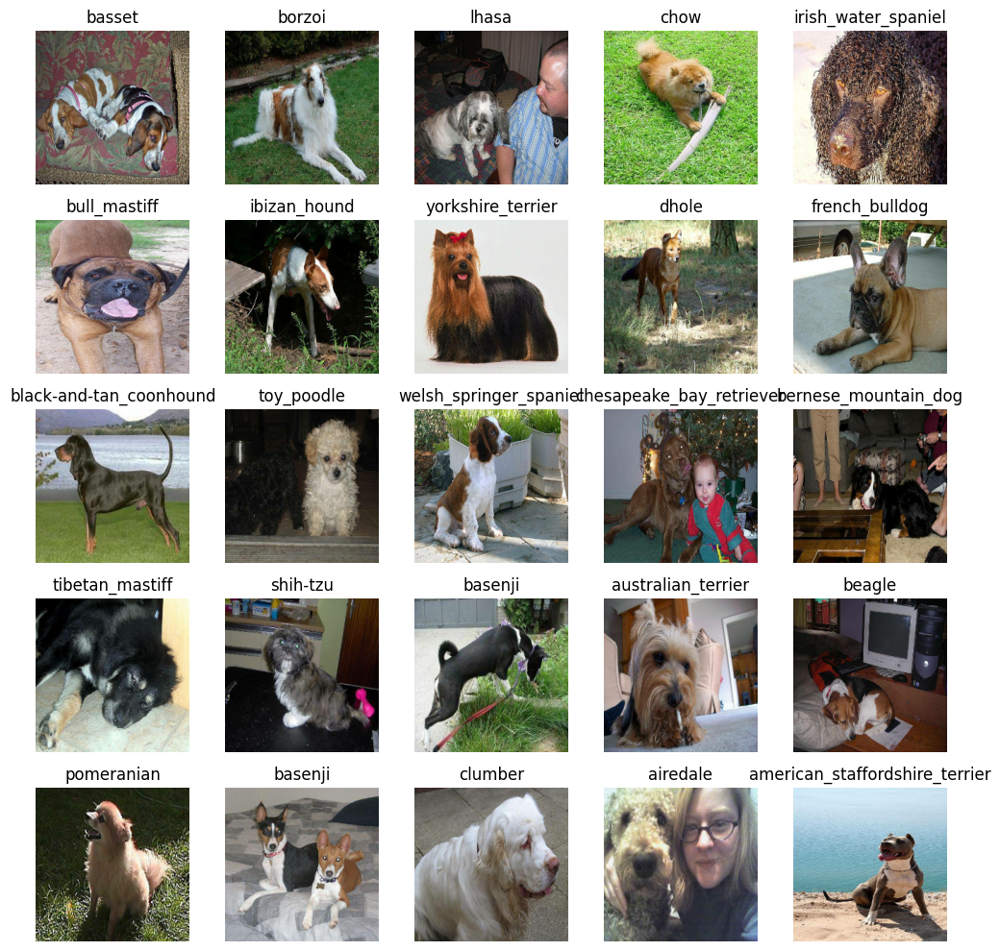

In [33]:
show_some_images(train_images,train_labels)

## Visualizing data in a validation batch

In [34]:
val_images,val_labels = next(val_data.as_numpy_iterator())

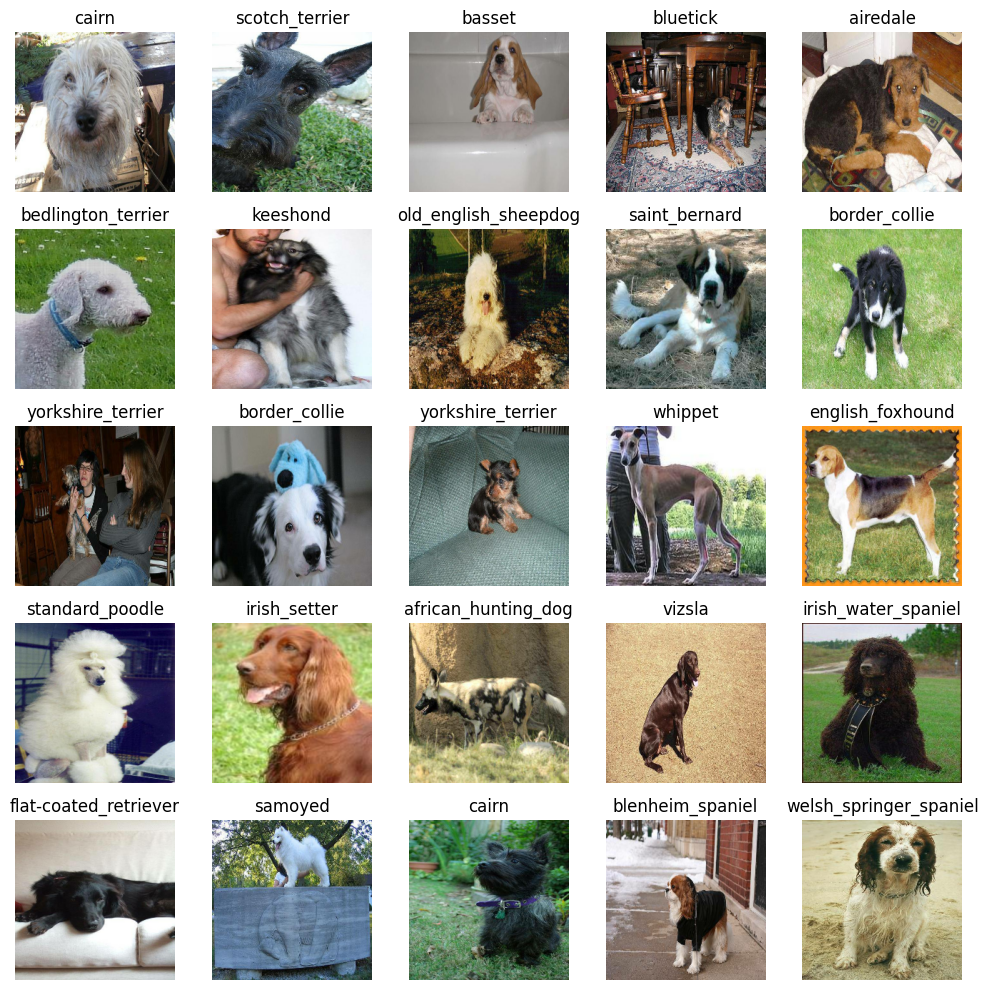

In [35]:
show_some_images(val_images,val_labels)

## Building a model

we need to first define our inputs and outputs

the input shape ( our images shape , in the form of Tensors) to our model
the output shape ( our labels , in the form of Tensors) to our model
the URL of the model we want to use from TensorFlow Hub


In [36]:
# Setup input shape to the model
INPUT_SHAPE = [None,IMG_SIZE,IMG_SIZE,3]

# Setup output shape of our model
OUTPUT_SHAPE = 120

MODEL_URL = "https://tfhub.dev/google/tf2-preview/mobilenet_v2/classification/4"

In [37]:
pip install tf-keras==2.15.1

## Now we have got our inputs and our outputs and the model we want to use

In [38]:
def create_model(input_shape=INPUT_SHAPE,output_shape=OUTPUT_SHAPE,model_url=MODEL_URL):
  print("Building model with ", model_url)

  #setup model layers
  model = tf.keras.Sequential([
  hub.KerasLayer(model_url), # layer 1
  tf.keras.layers.Dense(units=OUTPUT_SHAPE,activation='softmax') # layer 2
])

  model.compile(loss=tf.keras.losses.CategoricalCrossentropy(),
                optimizer=tf.keras.optimizers.Adam(),
                metrics=['accuracy'])
  model.build(INPUT_SHAPE)
  return model

In [39]:
model = create_model()
model.summary()

Building model with  https://tfhub.dev/google/tf2-preview/mobilenet_v2/classification/4
Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 keras_layer (KerasLayer)    (None, 1001)              3540265   
                                                                 
 dense (Dense)               (None, 120)               120240    
                                                                 
Total params: 3660505 (13.96 MB)
Trainable params: 120240 (469.69 KB)
Non-trainable params: 3540265 (13.51 MB)
_________________________________________________________________


## Creating callback functions

In [40]:
# Load TensorBoard notebook extension
%load_ext tensorboard

In [41]:
import datetime

#Create a function to build a tensorboard callback
def create_tensorboard_callback():
  #create a log directory for storing TensorBoard logs
  logdir = os.path.join("/content/drive/MyDrive/dog-breed-identification/logs",datetime.datetime.now().strftime("%Y%m%d-%H%M%S"))
  return tf.keras.callbacks.TensorBoard(logdir)

## Early Stopping

In [42]:
# Create early stopping callback
early_stopping = tf.keras.callbacks.EarlyStopping(monitor="val_accuracy",
                                                   patience=3)

## Training a model on a subset of data

In [43]:
NUM_EPOCHS = 100 #@param {type:"slider",min:10,max:100,step:10}

In [44]:
#Build a function to train and return a trained model
def train_model():
  #create a model
  model = create_model()

  #create tensorboard session
  tensorboard = create_tensorboard_callback()

  #Fit the model to the data with callbacks
  model.fit(x=train_data,epochs=NUM_EPOCHS,validation_data=val_data,validation_freq=1,callbacks=[tensorboard,early_stopping])

  #return model
  return model

In [45]:
model = train_model()

Building model with  https://tfhub.dev/google/tf2-preview/mobilenet_v2/classification/4
Epoch 1/100
25/25 [==============================] - 220s 8s/step - loss: 4.6412 - accuracy: 0.0925 - val_loss: 3.2050 - val_accuracy: 0.2850
Epoch 2/100
25/25 [==============================] - 40s 2s/step - loss: 1.5609 - accuracy: 0.7262 - val_loss: 1.9817 - val_accuracy: 0.5350
Epoch 3/100
25/25 [==============================] - 40s 2s/step - loss: 0.5185 - accuracy: 0.9388 - val_loss: 1.5633 - val_accuracy: 0.6450
Epoch 4/100
25/25 [==============================] - 35s 1s/step - loss: 0.2257 - accuracy: 0.9925 - val_loss: 1.4070 - val_accuracy: 0.6700
Epoch 5/100
25/25 [==============================] - 41s 2s/step - loss: 0.1333 - accuracy: 0.9975 - val_loss: 1.3516 - val_accuracy: 0.6750
Epoch 6/100
25/25 [==============================] - 37s 2s/step - loss: 0.0918 - accuracy: 1.0000 - val_loss: 1.3118 - val_accuracy: 0.6750
Epoch 7/100
25/25 [==============================] - 40s 2s/step 

# Checking the TensorBoard logs

In [46]:
%tensorboard --logdir /content/drive/MyDrive/dog-breed-identification/logs

<IPython.core.display.Javascript object>

In [47]:
## Making and evaluating predictions using a trained model
predictions = model.predict(val_data,verbose=1)
predictions

7/7 [==============================] - 10s 1s/step


array([[2.16879766e-03, 1.44559264e-04, 2.45121919e-04, ...,
        2.05930148e-04, 3.47715832e-04, 2.38018227e-03],
       [3.77706718e-04, 3.88746877e-04, 4.46895882e-03, ...,
        1.42691497e-04, 2.45618057e-02, 1.84688124e-05],
       [4.17308854e-07, 1.69020903e-04, 3.14494609e-05, ...,
        9.16741410e-05, 1.79940704e-04, 8.18523671e-03],
       ...,
       [2.89852323e-06, 8.39460990e-05, 2.21216069e-05, ...,
        1.23854743e-05, 5.43055830e-05, 1.21411635e-04],
       [1.12205242e-04, 9.54964071e-06, 8.03851071e-05, ...,
        4.25329454e-05, 7.96674794e-05, 2.21876102e-03],
       [1.38762247e-04, 1.35976170e-05, 3.95851006e-04, ...,
        5.53303864e-03, 4.19685151e-04, 4.48983832e-04]], dtype=float32)

In [48]:
predictions.shape

(200, 120)

In [49]:
#first prediction
print(predictions[42])
print(f"Maximum probability {np.max(predictions[42])}")
print(f"Max index of probability {np.argmax(predictions[42])}")
print(f"Predicted label {un[np.argmax(predictions[42])]}")

[2.74469876e-05 2.31590147e-05 5.39355497e-05 6.94349234e-04
 2.90573202e-03 3.33033422e-05 1.09952038e-04 1.23295968e-03
 5.95183298e-03 1.45405233e-02 1.83538668e-05 4.50273765e-05
 1.85801633e-04 6.25683286e-04 9.10912699e-04 3.67181143e-04
 5.94253379e-06 1.07696098e-04 3.04960442e-04 7.34856803e-06
 4.62910066e-06 1.50228734e-03 5.27314933e-06 3.39794351e-05
 9.33349412e-03 1.78165810e-05 2.31320646e-05 9.88768875e-07
 1.03216240e-04 3.91007461e-06 6.40807775e-05 5.89011543e-05
 4.07473744e-05 1.21645819e-04 2.13635998e-04 1.41455139e-05
 2.94976708e-05 6.90394081e-04 1.19763070e-04 7.57250547e-01
 5.90240707e-05 6.19188431e-05 4.95833112e-04 7.92321225e-05
 2.49847508e-04 2.47603693e-05 3.68854031e-04 1.68135433e-04
 1.18041726e-05 1.14828232e-04 1.08673285e-05 1.86722573e-05
 4.41529934e-04 5.24462783e-04 9.78230382e-05 6.47256500e-04
 4.99300113e-05 5.83104447e-05 1.64510911e-05 3.48228750e-05
 3.17258236e-05 8.99692968e-05 3.07980736e-06 3.23124482e-06
 1.29030377e-04 2.739027

In [50]:
un[39]

'english_foxhound'

##Note: prediction probabilities are also known as confidence levels

In [51]:
# Turn probabilities into their corresponding labels
def get_pred_label(predictions):
  return un[np.argmax(predictions)]

#get predicted label based on an array of prediction probabilities
pred_label = get_pred_label(predictions[199])
pred_label

'collie'

In [52]:
# Create a function to unbatch a batched dataset
images_ =  []
labels_ = []
for image,label in val_data.unbatch().as_numpy_iterator():
  images_.append(image)
  labels_.append(label)
images_[0],labels_[0]

(array([[[0.29599646, 0.43284872, 0.3056691 ],
         [0.26635826, 0.32996926, 0.22846507],
         [0.31428418, 0.27701408, 0.22934894],
         ...,
         [0.77614343, 0.82320225, 0.8101595 ],
         [0.81291157, 0.8285351 , 0.8406944 ],
         [0.8209297 , 0.8263737 , 0.8423668 ]],
 
        [[0.2344871 , 0.31603682, 0.19543913],
         [0.3414841 , 0.36560842, 0.27241898],
         [0.45016077, 0.40117094, 0.33964607],
         ...,
         [0.7663987 , 0.8134138 , 0.81350833],
         [0.7304248 , 0.75012016, 0.76590735],
         [0.74518913, 0.76002574, 0.7830809 ]],
 
        [[0.30157745, 0.3082587 , 0.21018331],
         [0.2905954 , 0.27066195, 0.18401104],
         [0.4138316 , 0.36170745, 0.2964005 ],
         ...,
         [0.79871625, 0.8418535 , 0.8606443 ],
         [0.7957738 , 0.82859945, 0.8605655 ],
         [0.75181633, 0.77904975, 0.8155256 ]],
 
        ...,
 
        [[0.9746779 , 0.9878955 , 0.9342279 ],
         [0.99153054, 0.99772066, 0.94278

In [53]:
get_pred_label(labels_[0])

'cairn'

In [54]:
def unbatchify(data):
  unbatch_images = []
  unbatch_labels = []
  for image,label in data.unbatch().as_numpy_iterator():
    unbatch_images.append(image)
    unbatch_labels.append(label)
  return unbatch_images,unbatch_labels

val_images,val_labels = unbatchify(val_data)
val_images[0],val_labels[0]

(array([[[0.29599646, 0.43284872, 0.3056691 ],
         [0.26635826, 0.32996926, 0.22846507],
         [0.31428418, 0.27701408, 0.22934894],
         ...,
         [0.77614343, 0.82320225, 0.8101595 ],
         [0.81291157, 0.8285351 , 0.8406944 ],
         [0.8209297 , 0.8263737 , 0.8423668 ]],
 
        [[0.2344871 , 0.31603682, 0.19543913],
         [0.3414841 , 0.36560842, 0.27241898],
         [0.45016077, 0.40117094, 0.33964607],
         ...,
         [0.7663987 , 0.8134138 , 0.81350833],
         [0.7304248 , 0.75012016, 0.76590735],
         [0.74518913, 0.76002574, 0.7830809 ]],
 
        [[0.30157745, 0.3082587 , 0.21018331],
         [0.2905954 , 0.27066195, 0.18401104],
         [0.4138316 , 0.36170745, 0.2964005 ],
         ...,
         [0.79871625, 0.8418535 , 0.8606443 ],
         [0.7957738 , 0.82859945, 0.8605655 ],
         [0.75181633, 0.77904975, 0.8155256 ]],
 
        ...,
 
        [[0.9746779 , 0.9878955 , 0.9342279 ],
         [0.99153054, 0.99772066, 0.94278

In [55]:
get_pred_label(val_labels[0])

'cairn'

## Visualizing the Model's Predictions

In [56]:
def plot_pred(predictions,labels,images,n=1):
  pred= predictions[n]
  true_label= labels[n]
  image = images[n]

  pred_label = get_pred_label(pred)
  true_label = get_pred_label(true_label)
  plt.imshow(image)
  plt.xticks([])
  plt.yticks([])

  if pred_label == true_label:
    color = "green"
  else:
    color = "red"
  plt.title("{} {:2.0f}% {}".format(pred_label,np.max(pred *100),true_label),color=color)
  #plt.show()

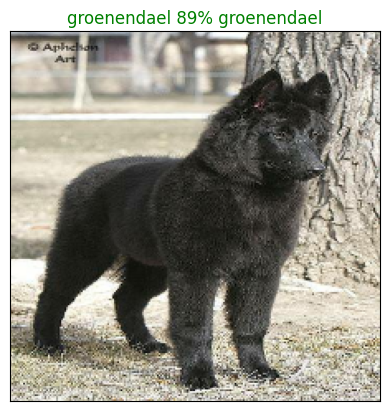

In [57]:
plot_pred(predictions=predictions,labels=val_labels,images=val_images,n=45)

In [58]:
def plot_pred_conf(predictions,labels,images,n=1):
  pred_prob,true_label = predictions[n],labels[n]
  pred_label = get_pred_label(pred_prob)
  top_10_indexs = pred_prob.argsort()[-10:][::-1]
  top_10_pred_values = pred_prob[top_10_indexs]
  top_10_pred_labels = un[top_10_indexs]

  top_plot = plt.bar(np.arange(len(top_10_pred_labels)),top_10_pred_values,tick_label=top_10_pred_labels,color='grey')

  plt.xticks(rotation='vertical')

  if np.isin(true_label,top_10_pred_labels).any():
    top_plot[np.argmax(top_10_pred_labels)].set_color('green')
  else:
    pass






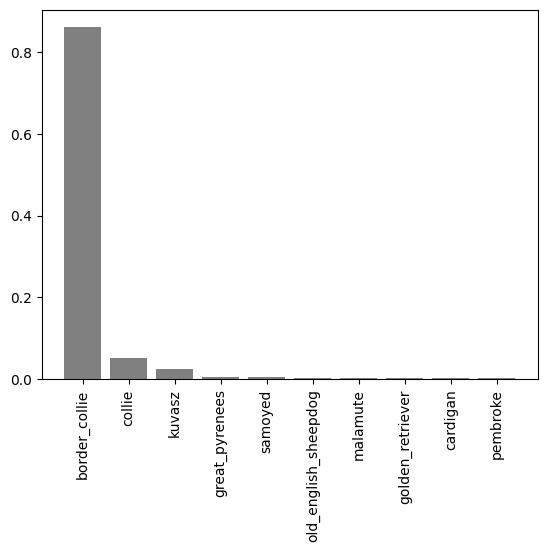

In [59]:
plot_pred_conf(predictions=predictions,labels=val_labels,images=val_images,n=11)

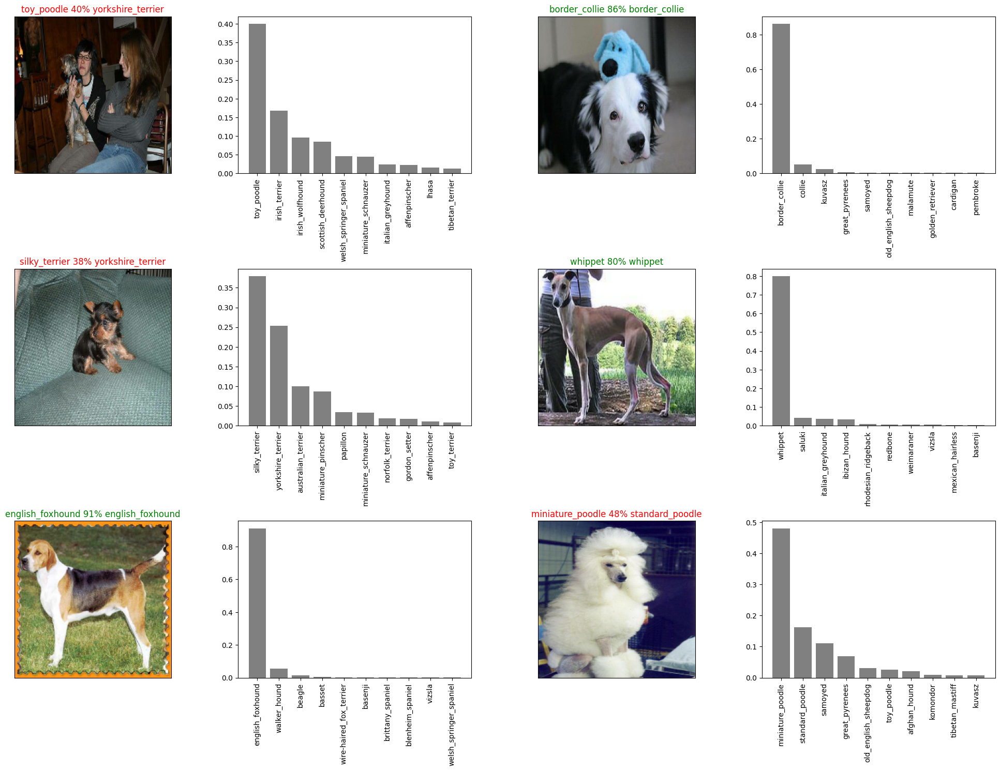

In [60]:
i_multiplier = 10
num_rows = 3
num_cols = 2
num_images = num_rows * num_cols
plt.figure(figsize=(10*num_cols,5*num_rows))
for i in range(num_images):
  plt.subplot(num_rows,2*num_cols,2*i+1)
  plot_pred(predictions=predictions,labels=val_labels,images=val_images,n=i+i_multiplier)
  plt.subplot(num_rows,2*num_cols,2*i+2)
  plot_pred_conf(predictions=predictions,labels=val_labels,images=val_images,n=i+i_multiplier)
plt.tight_layout(h_pad=1.0)
plt.show()

## Saving and Reloading a model

In [61]:
# Create a function to save model

def save_model(model, suffix=None):
    # Create timestamp string
    timestamp = datetime.now().strftime('%Y%m%d-%H%M%S')

    # Create model directory path
    modeldir = "/content/drive/MyDrive/dog-breed-identification/models"

    # Create filename
    if suffix:
        filename = f"{timestamp}-{suffix}.h5"
    else:
        filename = f"{timestamp}.h5"

    # Join path and filename
    model_path = os.path.join(modeldir, filename)

    print(f'Saving model to {model_path} ........')
    model.save(model_path)
    return model_path

In [62]:
import os
from datetime import datetime

In [63]:
# Create a function to load a trained model
def load_model(model_path):
    print(f"Loading saved model from {model_path}")
    model = tf.keras.models.load_model(model_path, custom_objects={"KerasLayer": hub.KerasLayer})
    return model

In [64]:
import os
from datetime import datetime

In [65]:
save_model(model,suffix='1000-images-mobilenetv2-Adam')

Saving model to /content/drive/MyDrive/dog-breed-identification/models/20250816-010544-1000-images-mobilenetv2-Adam.h5 ........


/usr/local/lib/python3.11/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


'/content/drive/MyDrive/dog-breed-identification/models/20250816-010544-1000-images-mobilenetv2-Adam.h5'

In [66]:
loaded_model = load_model('/content/drive/MyDrive/dog-breed-identification/models/20250811-211325-1000-images-mobilenetv2-Adam.h5')

Loading saved model from /content/drive/MyDrive/dog-breed-identification/models/20250811-211325-1000-images-mobilenetv2-Adam.h5


In [67]:
loaded_model.summary()

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 keras_layer_1 (KerasLayer)  (None, 1001)              3540265   
                                                                 
 dense_1 (Dense)             (None, 120)               120240    
                                                                 
Total params: 3660505 (13.96 MB)
Trainable params: 120240 (469.69 KB)
Non-trainable params: 3540265 (13.51 MB)
_________________________________________________________________


In [68]:
loaded_model.evaluate(val_data)

7/7 [==============================] - 9s 1s/step - loss: 1.3692 - accuracy: 0.6400


[1.3692463636398315, 0.6399999856948853]

In [69]:
model.evaluate(val_data)

7/7 [==============================] - 8s 1s/step - loss: 1.2238 - accuracy: 0.7000


[1.2238377332687378, 0.699999988079071]

## Train on a full dataset

In [70]:
full_data = create_data_batches(x,y)

Creating training data batches..


In [71]:
full_data

<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

In [72]:
#full_model = create_model()

In [73]:
# Create full model fallbacks
#full_model_tensorboard = create_tensorboard_callback()
#full_model_early_stopping = tf.keras.callbacks.EarlyStopping(monitor="accuracy",patience=3)

In [74]:
#full_model.fit(x=full_data,epochs=NUM_EPOCHS,callbacks=[full_model_tensorboard,full_model_early_stopping])

In [75]:
#save_model(full_model,suffix='full-dataset-mobilenetv2-Adam')

In [76]:
loaded_full_model = load_model('/content/drive/MyDrive/dog-breed-identification/models/20250816-010544-1000-images-mobilenetv2-Adam.h5')

Loading saved model from /content/drive/MyDrive/dog-breed-identification/models/20250816-010544-1000-images-mobilenetv2-Adam.h5


In [77]:
loaded_full_model

##Making predictions on test data set

In [80]:
test_path = "/content/drive/MyDrive/dog-breed-identification/test/"
test_filenames =[test_path + fname for fname in os.listdir(test_path)]
test_filenames[:10]

['/content/drive/MyDrive/dog-breed-identification/test/e774fbfeb4b712ca042f93edea3835af.jpg',
 '/content/drive/MyDrive/dog-breed-identification/test/e57fded38af2f081403feefb324ed3a9.jpg',
 '/content/drive/MyDrive/dog-breed-identification/test/e2166bdff9e35f80aa7984ec64c8cce8.jpg',
 '/content/drive/MyDrive/dog-breed-identification/test/e312dda8d35118c40880c0f331c09509.jpg',
 '/content/drive/MyDrive/dog-breed-identification/test/e4d878f113883a3caab47d3126d2c2a4.jpg',
 '/content/drive/MyDrive/dog-breed-identification/test/e43f6e621469f438f351d31d889b839f.jpg',
 '/content/drive/MyDrive/dog-breed-identification/test/e63a126acd70223f2d388702843d185b.jpg',
 '/content/drive/MyDrive/dog-breed-identification/test/ddf2401701ee374c0f1f9dd607071ec7.jpg',
 '/content/drive/MyDrive/dog-breed-identification/test/dcfd3463e1d23d51b309b0385292870b.jpg',
 '/content/drive/MyDrive/dog-breed-identification/test/df2b5cee4b3d8a3cb893b668df16d572.jpg']

In [82]:
test_data = create_data_batches(test_filenames,y=None,test_data=True)

Creating test data batches...


In [83]:
test_predictions = loaded_full_model.predict(test_data,verbose=1)

324/324 [==============================] - 2667s 8s/step


In [84]:
np.savetxt('/content/drive/MyDrive/dog-breed-identification/test_predictions.csv',test_predictions,delimiter=',')

In [85]:
test_preds = np.loadtxt('/content/drive/MyDrive/dog-breed-identification/test_predictions.csv',delimiter=',')

In [86]:
test_preds

array([[1.46642840e-03, 2.09012960e-05, 6.37092235e-05, ...,
        1.02741644e-04, 1.05161790e-03, 1.99581124e-03],
       [3.91050089e-05, 5.09911188e-05, 9.67228989e-05, ...,
        6.31982973e-03, 4.74939261e-05, 3.13313149e-06],
       [4.57852684e-06, 5.35559011e-05, 2.49895547e-05, ...,
        2.75748289e-06, 1.12592665e-04, 1.47324945e-05],
       ...,
       [8.57727289e-01, 1.98348876e-04, 8.55190228e-05, ...,
        3.24528628e-05, 5.45734147e-05, 2.96955951e-03],
       [6.84875017e-03, 1.81401044e-03, 2.27497634e-03, ...,
        9.41240723e-05, 9.65551299e-04, 2.16240436e-03],
       [1.25467079e-06, 5.63887852e-07, 4.23874262e-05, ...,
        1.25126418e-04, 2.86821087e-05, 6.52886058e-07]])

##Preparing test submission for Kaggle

In [87]:
preds_df = pd.DataFrame(columns=['id'] + list(un),)
preds_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier


In [88]:
test_ids = [os.path.splitext(path)[0] for path in os.listdir(test_path)]
test_ids[:10]

['e774fbfeb4b712ca042f93edea3835af',
 'e57fded38af2f081403feefb324ed3a9',
 'e2166bdff9e35f80aa7984ec64c8cce8',
 'e312dda8d35118c40880c0f331c09509',
 'e4d878f113883a3caab47d3126d2c2a4',
 'e43f6e621469f438f351d31d889b839f',
 'e63a126acd70223f2d388702843d185b',
 'ddf2401701ee374c0f1f9dd607071ec7',
 'dcfd3463e1d23d51b309b0385292870b',
 'df2b5cee4b3d8a3cb893b668df16d572']

In [89]:
preds_df['id'] = test_ids
preds_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier
0,e774fbfeb4b712ca042f93edea3835af,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,e57fded38af2f081403feefb324ed3a9,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,e2166bdff9e35f80aa7984ec64c8cce8,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,e312dda8d35118c40880c0f331c09509,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,e4d878f113883a3caab47d3126d2c2a4,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [91]:
preds_df[list(un)] = test_predictions
preds_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier
0,e774fbfeb4b712ca042f93edea3835af,0.001466,0.000021,0.000064,0.002674,0.000524,0.000434,0.017787,0.001303,0.000707,...,0.000075,0.000264,0.000419,0.000123,0.000519,0.000126,0.000539,0.000103,0.001052,0.001996
1,e57fded38af2f081403feefb324ed3a9,0.000039,0.000051,0.000097,0.000003,0.000352,0.000008,0.000015,0.000092,0.000628,...,0.000343,0.000001,0.000015,0.011490,0.000052,0.000073,0.001054,0.006320,0.000047,0.000003
2,e2166bdff9e35f80aa7984ec64c8cce8,0.000005,0.000054,0.000025,0.000122,0.000055,0.000100,0.000027,0.000004,0.002033,...,0.000008,0.000017,0.000011,0.000016,0.000009,0.968826,0.000009,0.000003,0.000113,0.000015
3,e312dda8d35118c40880c0f331c09509,0.000368,0.000003,0.000528,0.000005,0.000053,0.000004,0.000338,0.000620,0.000095,...,0.000014,0.000173,0.000022,0.000002,0.000015,0.000002,0.000021,0.000050,0.000006,0.000024
4,e4d878f113883a3caab47d3126d2c2a4,0.012271,0.000994,0.000143,0.000288,0.000625,0.000168,0.000027,0.000755,0.002065,...,0.022032,0.002745,0.007520,0.015641,0.092229,0.001275,0.000037,0.000355,0.000775,0.000965


In [92]:
preds_df.to_csv('/content/drive/MyDrive/dog-breed-identification/fares_ibrahim_submission.csv',index=False)

##Making predictions on custom images

In [117]:
custom_path = '/content/drive/MyDrive/dog-breed-identification/custom-photos/pics/'
custom_image_paths = [custom_path + fname for fname in os.listdir(custom_path)]

In [118]:
custom_image_paths

['/content/drive/MyDrive/dog-breed-identification/custom-photos/pics/dog-photo-1.jpeg',
 '/content/drive/MyDrive/dog-breed-identification/custom-photos/pics/dog-photo-2.jpeg',
 '/content/drive/MyDrive/dog-breed-identification/custom-photos/pics/dog-photo-3.jpeg']

In [119]:
custom_data = create_data_batches(custom_image_paths,y=None, test_data=True)
custom_data

Creating test data batches...


<_BatchDataset element_spec=TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None)>

In [120]:
custom_preds = loaded_full_model.predict(custom_data)

1/1 [==============================] - 0s 211ms/step


In [121]:
custom_pred_labels = [get_pred_label(custom_preds[i]) for i in range(len(custom_preds))]
custom_pred_labels

['golden_retriever', 'maltese_dog', 'labrador_retriever']

In [122]:
custom_images = []
# Loop through unbatched data
for image in custom_data.unbatch().as_numpy_iterator():
  custom_images.append(image)

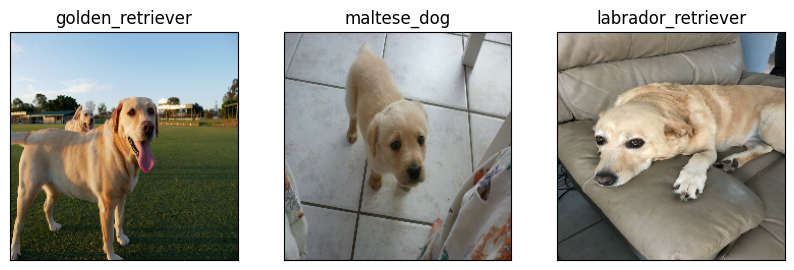

In [123]:
# Check custom image predictions
plt.figure(figsize=(10, 10))
for i, image in enumerate(custom_images):
  plt.subplot(1, 3, i+1)
  plt.xticks([])
  plt.yticks([])
  plt.title(custom_pred_labels[i])
  plt.imshow(image)